# Toy model superposition

In [1]:
%pip install setuptools ipykernel transformer-lens nbformat plotly einops ipywidgets matplot numpy

  Using cached matplot-0.1.9-py2.py3-none-any.whl.metadata (241 bytes)
  Using cached pyloco-0.0.139-py2.py3-none-any.whl.metadata (1.1 kB)
  Using cached ushlex-0.99.1-py3-none-any.whl
  Using cached websocket_client-1.8.0-py3-none-any.whl.metadata (8.0 kB)
  Using cached twine-5.1.1-py3-none-any.whl.metadata (3.5 kB)
  Using cached typing-3.7.4.3-py3-none-any.whl
  Using cached SimpleWebSocketServer-0.1.2-py3-none-any.whl
  Using cached pkginfo-1.11.1-py3-none-any.whl.metadata (11 kB)
  Using cached readme_renderer-44.0-py3-none-any.whl.metadata (2.8 kB)
  Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl.metadata (14 kB)
  Using cached importlib_metadata-8.4.0-py3-none-any.whl.metadata (4.7 kB)
  Using cached keyring-25.3.0-py3-none-any.whl.metadata (20 kB)
  Using cached rfc3986-2.0.0-py2.py3-none-any.whl.metadata (6.6 kB)
  Using cached pkginfo-1.10.0-py3-none-any.whl.metadata (11 kB)
  Using cached zipp-3.20.0-py3-none-any.whl.metadata (3.6 kB)
  Using cached jaraco.class

# Core idea

Models exhibit a behaviour where features are represented as superposition of basis in an activation space.
The basis may or may not be actual neurons. This depends on how sparse the features are. 
When the features are dense - the model learns to represent important features using few orthogonal bases and most other features are ignored.
Otherwise, if the features are sparse, then the model uses superposition to compress information and represent all features as vectors having some interference.

<img src="./superposition_fig.png" width="800">

### Emperical phenomena:
1. Word embeddings:
    
    Word embeddings have directions which appear to have semantic properties.
    > Eg. V("man") - V("woman") ≈ V("king") - V("queen")

2. Universality:
    
    Many analogous neurons responding to same properties can be found across networks.

3. Polysemantic neurons:
    
    There are many neurons which appear to not respond to an interpretable property of the input, and in particular, many polysemantic neurons which appear to respond to unrelated mixtures of inputs

## Freatures

Freatures are encoded as directions in some space.

## Priviledged vs non-priviledged basis.
Basis means reference vector space in which we are analysing the information. Basis change based on Linear transformations we apply on the information.
For example - Residual stream, Word Embedding, MLP are transformations.

Chosing some basis reveal features with interesting directions, while others don't.
Spaces which reveal such interesting directions are called priviledged basis.

We focus on studying priviledged basis to understand a model in depth.

<img src="basis_fig.png" width="800">

## Superposition Hypothesis

Neurons in a privilidged basis can be polysymantic, that is they can respond to several unrelated features. It is hypothesised that it happens because of "Superposition".
Neural networks want to represent more features than the neurons they have, hence superposition occurs.

<img src="polysymanticity_fig.png" width="800">

## Properties of features:

1. Decomposability: 
  Neural network activations which are decomposable can be decomposed into features, the meaning of which is not dependent on the value of other features. (This property is ultimately the most important – see the role of decomposition in defeating the curse of dimensionality.)

2. Linearity: 
  Features correspond to directions. Each feature $f_i$ has a corresponding representation direction $W_i$. The presence of multiple features $f_1, f_2 ...$​ activating with values $x_{f_1}, x_{f_2}, ... x_{f_1}$ is represented by $x_{f_1}W_{f_1} + x_{f_2}W_{f_2} ...$

3. Superposition vs Non-Superposition: 
  A linear representation exhibits superposition if $W^TW$ is not invertible. If $W^TW$ is invertible, it does not exhibit superposition.

4. Basis-Aligned: A representation is basis aligned if all $W_i$ are one-hot basis vectors. A representation is partially basis aligned if all $W_i$ are sparse. This requires a privileged basis.


The first two (decomposability and linearity) are properties we hypothesize to be widespread, while the latter (non-superposition and basis-aligned) are properties we believe only sometimes occur.

## Demonstrating Superposition

Can Neural networks noisily represent more features than they have neurons ?

Let $x \isin R^n$ and $h \isin R^m$ where $n > m$. That is $R^m$ is a lower dimensional vector.

<img src="superposition_exp_fig.png" width="800">

Here, the above diagram represents that features in $n$ dimensions can be packed (superposition) into $m$ dimension ($n > m$) by doing a linear transformation
$$y = Wx + b$$
Then, it can be recovered by doing another linear transformation of $W^T$ that maps superimposed features into almost orthagonal features in higher dimensions.
$$x^\prime = W^TWx + W^Tb$$
$$x^\prime = W^TWx + b^\prime$$

$\implies x^\prime = W^TWx + b$

$b^\prime$ is a constant, we can change the name of the variable without losing generality.

Here, if we train our toy model that has low error on $x^\prime-x$.

Doing this we can end up having a superposition in our toy model that allows packing and unpacking of features 
from high dimension $n$ to low dimensions $m$ and vice-versa respectively.

We also need to understand what is the impact of having or not having a non-linear unit like ReLU in the toy model.
So we can create 2 different versions of toy model
1. Linear model - $x^\prime = W^TWx + b$
2. Relu model - $x^\prime = ReLU(W^TWx + b)$

$x$ need to be having different levels of sparsity and importance.

$n_{instances}$ keeps track of instances having sparsity from low to high levels.

### Generate synthetic data

1. $x$ is a vector with $x_i$ as dimension and it's coefficient is 0 with probability $S_i$.
2. If it's coefficient is not zero then it is normalized between $(0, 1]$
3. Moreover, each dimension $x_i$ has importance $I_i$ 
4. We fix, $n = 20$, $m=5$ and $I_i = 0.7^i$, where $n$ is higher dimension and $m$ is lower dimension. $I_i$ is importance of i-th dimension. 
5. Data is generated for different sparsity values.

In [2]:
from typing import Optional
import torch
import torch.nn as nn
import torch.nn.functional as F
from dataclasses import dataclass

@dataclass
class Config:
    n_features: int
    n_hidden: int
    n_instances: int

class LinearModel(nn.Module):
    def __init__(
        self, 
        config: Config,
        feature_prob: Optional[torch.Tensor] = None,
        importance: Optional[torch.Tensor] = None,
        name: str = "Linear",
    ) -> None:
        super().__init__()
        self.config = config
        self.W = nn.Parameter(torch.empty((config.n_instances, config.n_features, config.n_hidden)))
        nn.init.xavier_normal_(self.W)
        self.b = nn.Parameter(torch.zeros((config.n_instances, config.n_features)))
        
        if feature_prob is None:
            feature_prob = torch.ones(())
        
        self.feature_prob = feature_prob
        
        if importance is None:
            importance = torch.ones(())
        
        self.importance = importance
        self.name = name
    
    def forward(self, features: torch.Tensor) -> torch.Tensor:
        # features [..., n_instances, n_features]
        # W: [n_instances, n_features, n_hidden]
        hidden = torch.einsum("...if,ifh->...ih", features, self.W)
        out = torch.einsum("...ih,ifh->...if", hidden, self.W)
        out = out + self.b
        return out
    
    def generate_batch(self, n_batch: int) -> torch.Tensor:
        feat = torch.randn((n_batch, self.config.n_instances, self.config.n_features))
        return torch.where(
            torch.rand((n_batch, self.config.n_instances, self.config.n_features)) <= self.feature_prob,
            feat,
            torch.zeros(()),
        )

class ReluModel(nn.Module):
    def __init__(
        self, 
        config: Config,
        feature_prob: Optional[torch.Tensor] = None,
        importance: Optional[torch.Tensor] = None,
        name: str = "Relu",
    ) -> None:
        super().__init__()
        self.config = config
        self.W = nn.Parameter(torch.empty((config.n_instances, config.n_features, config.n_hidden)))
        nn.init.xavier_normal_(self.W)
        self.b = nn.Parameter(torch.zeros((config.n_instances, config.n_features)))
        
        if feature_prob is None:
            feature_prob = torch.ones(())
        
        self.feature_prob = feature_prob
        
        if importance is None:
            importance = torch.ones(())
        
        self.importance = importance
        self.name = name
    
    def forward(self, features: torch.Tensor) -> torch.Tensor:
        # features [..., n_instances, n_features]
        # W: [n_instances, n_features, n_hidden]
        hidden = torch.einsum("...if,ifh->...ih", features, self.W)
        out = torch.einsum("...ih,ifh->...if", hidden, self.W)
        out = out + self.b
        return F.relu(out)
    
    def generate_batch(self, n_batch: int) -> torch.Tensor:
        ## generate features with values in range [0, 1] having shape [n_batch, n_instances, n_features]
        feat = torch.rand((n_batch, self.config.n_instances, self.config.n_features))
        return torch.where(
            torch.rand((n_batch, self.config.n_instances, self.config.n_features)) <= self.feature_prob,
            feat,
            torch.zeros(()),
        )

torch.set_default_device("mps")

### Test models

Lightweight tests to check if the models are outputing correct shape on forward pass or not.

In [11]:
from typing import List

def should_have_correct_output_shape(cls, cfg: Config, exp_shape: List[int]) -> None:
    model = cls(cfg)
    x = model.generate_batch(1)
    y = model.forward(x[0])
    
    assert torch.Size(exp_shape) == y.shape, f"shape does not match {torch.Size(exp_shape)} != {y.shape}"

In [12]:
cfg = Config(n_features=5, n_hidden=2, n_instances=10)

should_have_correct_output_shape(LinearModel, cfg, [cfg.n_instances, cfg.n_features])
should_have_correct_output_shape(ReluModel, cfg, [cfg.n_instances, cfg.n_features])

### Loss function
$$L = \sum_{x} \sum_{i} I_i(x_i - x_i^{\prime})^2$$

## Model training

In [5]:
import time
import plotly.express as px
import einops
from tqdm.notebook import trange
import numpy as np

def linear_lr(step, steps):
  return (1 - (step / steps))

def constant_lr(*_):
  return 1.0

def cosine_decay_lr(step, steps):
  return np.cos(0.5 * np.pi * step / (steps - 1))

def optimize(model, 
             render=False, 
             n_batch=1024,
             steps=10_000,
             print_freq=100,
             lr=1e-3,
             lr_scale=constant_lr,
             hooks=[]):
  cfg = model.config

  opt = torch.optim.AdamW(list(model.parameters()), lr=lr)

  losses = []
  start = time.time()
  with trange(steps) as t:
    for step in t:
      step_lr = lr * lr_scale(step, steps)
      for group in opt.param_groups:
        group['lr'] = step_lr
      opt.zero_grad(set_to_none=True)
      batch = model.generate_batch(n_batch)
      out = model(batch)
      error = (model.importance*(batch.abs() - out)**2)
      loss = einops.reduce(error, 'b i f -> i', 'mean').sum()
      losses.append(loss.item())
      loss.backward()
      opt.step()
    
      if hooks:
        hook_data = dict(model=model,
                         step=step, 
                         opt=opt,
                         error=error,
                         loss=loss,
                         lr=step_lr)
        for h in hooks:
          h(hook_data)
      if step % print_freq == 0 or (step + 1 == steps):
        t.set_postfix(
            loss=loss.item() / cfg.n_instances,
            lr=step_lr,
        )
  return losses

config = Config(
    n_features = 5,
    n_hidden = 2,
    n_instances = 10,
)

linear_model = LinearModel(
    config=config,
    # Exponential feature importance curve from 1 to 1/100
    importance = (0.9**torch.arange(config.n_features))[None, :],
    # Sweep feature frequency across the instances from 1 (fully dense) to 1/20
    feature_prob = (20 ** -torch.linspace(0, 1, config.n_instances))[:, None]
)
relu_model = ReluModel(
    config=config,
    # Exponential feature importance curve from 1 to 1/100
    importance = (0.9**torch.arange(config.n_features))[None, :],
    # Sweep feature frequency across the instances from 1 (fully dense) to 1/20
    feature_prob = (20 ** -torch.linspace(0, 1, config.n_instances))[:, None]
)

linear_model_losses = optimize(linear_model)
relu_model_losses = optimize(relu_model)

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

In [7]:
px.line(linear_model_losses, labels={"x": "Epoch", "y": "Loss"}, title=f"Linear model loss")

In [6]:
px.line(relu_model_losses, labels={"x": "Epoch", "y": "Loss"}, title=f"ReLU model loss")

## Visualization and analysis of superposition

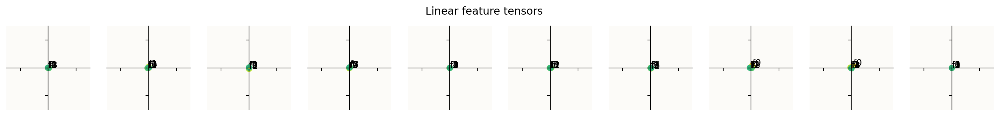

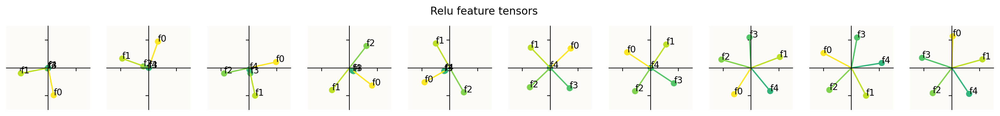

In [115]:
import collections
import matplotlib.pyplot as plt
from matplotlib import colors  as mcolors
from matplotlib import collections  as mc
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go
  
def plot_intro_diagram(model):
  cfg = model.config
  WA = model.W.detach()
  sel = range(cfg.n_instances) # can be used to highlight specific sparsity levels
  
  fig, axs = plt.subplots(1, len(sel), figsize=(2*len(sel), 2))
  for i, ax in zip(sel, axs):
      # features shape: [n_features, n_hidden]
      # each row in this tensor represents a feature packed in lower dimension
      features = WA[i].cpu().detach().numpy()
      colors = [mcolors.to_rgba(c) for c in plt.rcParams['axes.prop_cycle'].by_key()['color']]
      x_data, y_data = features[:, 0], features[:, 1]
      ax.scatter(x_data, y_data, c=colors[0: len(x_data)])
      
      for f in range(cfg.n_features):
        ax.annotate(f"f{f}", (features[f,0], features[f,1]))

      ax.set_aspect('equal')
      # connect line from origin to scatter point
      ax.add_collection(mc.LineCollection(np.stack((np.zeros_like(features), features), axis=1), colors=colors))
      
      # zoom in till x_lim, y_lim = ±1.5
      z = 1.5
      ax.set_facecolor('#FCFBF8')
      ax.set_xlim((-z,z))
      ax.set_ylim((-z,z))
      ax.tick_params(left = True, right = False, labelleft = False, labelbottom = False, bottom = True)
      
      # display xy axes with origin at center of the figure
      for spine in ['top', 'right']:
          ax.spines[spine].set_visible(False)
      for spine in ['bottom','left']:
          ax.spines[spine].set_position('center')
  
  fig.suptitle(f"{model.name} feature tensors")
  plt.show()

def model_feature_norm(model, feature, instance):
  return torch.linalg.vector_norm(model.W[instance, feature]).cpu().detach().numpy()

def plot_norm_diff(models):
  fig = make_subplots(
    rows=len(models), 
    cols=models[0].config.n_features,
    subplot_titles=[f"{model.name}_f{feat+1}" for model in models for feat in range(model.config.n_features)],
  )
  for m, model in enumerate(models):
    for feat in range(model.config.n_features):
      data = []
      for i in range(model.config.n_instances):
        data.append(model_feature_norm(model, feat, i))
  
      fig.append_trace(
        go.Scatter(y=data, x=np.arange(len(data)), name=f"{model.name}_f{feat+1}"),
        row=m+1, col=feat+1
      )
  
  fig.update_layout(title_text="Feature norm vs sparsity")
  fig.show()

def plot_feat_intersection(model):
  # data: [instances, features]
  data = collections.defaultdict(list)
  
  for i in range(model.config.n_instances):
    W = model.W.cpu().detach()
    for f1 in range(model.config.n_features):
      for f2 in range(f1+1, model.config.n_features):
        dot = W[i,f1].vdot(W[i,f2])
        data[f"f{f1}.f{f2}"].append(dot**2)
  
  fig = px.line(data, labels={"x": "sparsity", "y": "dot product"}, title=f"{model.name} model feature dot product vs sparsity")
  fig.show()

plot_intro_diagram(linear_model)
plot_intro_diagram(relu_model)
plot_norm_diff([linear_model, relu_model])
plot_feat_intersection(linear_model)
plot_feat_intersection(relu_model)

### Observations:
1. Linear model cannot recover the original input $x$ as $W$ tensor is suppressed down to zero. All its features disappear as sparsity increases.
2. Relu model on the other hand represents its feature vectors from $n$ dimensions to $m$ dimensions with minimal amount of loss of information. Even though the $m$ space is smaller, it is still able to recover them because features are pairwise orthogonal.

### Mathematical analysis

Adding a RELU unit introduces superposition. Why ?
> Intuitive answer - there is a balance of two competing forces
1. Feature benefit
2. Interference


In [116]:
config = Config(
    n_features = 100,
    n_hidden = 20,
    n_instances = 20,
)

relu_model = ReluModel(
    config=config,
    # Exponential feature importance curve from 1 to 1/100
    importance = (100 ** -torch.linspace(0, 1, config.n_features))[None, :],
    # Sweep feature frequency across the instances from 1 (fully dense) to 1/20
    feature_prob = (20 ** -torch.linspace(0, 1, config.n_instances))[:, None]
)

In [117]:
optimize(relu_model)

  0%|          | 0/10000 [00:00<?, ?it/s]

[0.45486313104629517,
 0.45359405875205994,
 0.4429281949996948,
 0.43560659885406494,
 0.4263218641281128,
 0.41635510325431824,
 0.404946506023407,
 0.3946354389190674,
 0.3829410970211029,
 0.3701305389404297,
 0.3568797707557678,
 0.34415769577026367,
 0.3336704969406128,
 0.319786012172699,
 0.30840349197387695,
 0.2996128499507904,
 0.2911350429058075,
 0.2844981551170349,
 0.2807324230670929,
 0.2786376476287842,
 0.2779099643230438,
 0.278012752532959,
 0.27937352657318115,
 0.2802830934524536,
 0.2792520821094513,
 0.2784379720687866,
 0.2771833539009094,
 0.27490681409835815,
 0.27306318283081055,
 0.2697407603263855,
 0.26661381125450134,
 0.264890193939209,
 0.26357442140579224,
 0.2621474266052246,
 0.2611614763736725,
 0.2602096199989319,
 0.26133888959884644,
 0.2612761855125427,
 0.2608439028263092,
 0.2603750228881836,
 0.2608218193054199,
 0.26085489988327026,
 0.260608971118927,
 0.2611960768699646,
 0.2600002586841583,
 0.25989431142807007,
 0.2596476078033447,
 0.2

In [124]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def render_features(model, which=np.s_[:]):
  cfg = model.config
  W = model.W.detach()
  W_norm = W / (1e-5 + torch.linalg.norm(W, 2, dim=-1, keepdim=True))

  interference = torch.einsum('ifh,igh->ifg', W_norm, W)
  interference[:, torch.arange(cfg.n_features), torch.arange(cfg.n_features)] = 0

  polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()
  norms = torch.linalg.norm(W, 2, dim=-1).cpu()

  WtW = torch.einsum('sih,soh->sio', W, W).cpu()

  # width = weights[0].cpu()
  # x = torch.cumsum(width+0.1, 0) - width[0]
  x = torch.arange(cfg.n_features).cpu()
  width = 0.9

  which_instances = np.arange(cfg.n_instances)[which]
  fig = make_subplots(rows=len(which_instances),
                      cols=2,
                      shared_xaxes=True,
                      vertical_spacing=0.02,
                      horizontal_spacing=0.1)
  for (row, inst) in enumerate(which_instances):
    fig.add_trace(
        go.Bar(x=x, 
              y=norms[inst],
              marker=dict(
                  color=polysemanticity[inst],
                  cmin=0,
                  cmax=1
              ),
              width=width,
        ),
        row=1+row, col=1
    )
    data = WtW[inst].numpy()
    fig.add_trace(
        go.Image(
            z=plt.cm.coolwarm((1 + data)/2, bytes=True),
            colormodel='rgba256',
            customdata=data,
            hovertemplate='''\
In: %{x}
Out: %{y}
Weight: %{customdata:0.2f}
'''            
        ),
        row=1+row, col=2
    )

  fig.add_vline(
    x=(x[cfg.n_hidden-1]+x[cfg.n_hidden])/2, 
    line=dict(width=0.5),
    col=1,
  )
    
  # fig.update_traces(marker_size=1)
  fig.update_layout(showlegend=False, 
                    width=600,
                    height=100*len(which_instances),
                    margin=dict(t=0, b=0))
  fig.update_xaxes(visible=False)
  fig.update_yaxes(visible=False)
  return fig

In [125]:
fig = render_features(relu_model, np.s_[::2])
fig.update_layout()